## Walktrough to create a model that classifies aerial scene images

In this notebook, we will do an step by step walktrough of creating this clssificator and for that we need to:
- Define custom datasets and dataloaders using PyTorch
- Visualize our initial data with its true labels
- Do a small EDA check of class distribution
- Create our TensorBoard callbacks for logging our training metrics
- Train and validation cycle using PyTorch
- Inference using our model and displaying a grid of sample images
- Inference confusion matrics of our test dataset
- Use GradCAM to extract a feature map of a single image from a target layer of our model
- Do a GradCAM for 1 image of each class to understand what the model is looking

## Custom Datasets

A custom dataset object was created in `src/dataset.py`. This dataset is used in by the dataloaders module for the creation of the train, valid and test dataloaders.

## Dataloaders

The `src/dataloaders.py` file has the specific functions to create a random split dataset or a stratified split dataset.

## Initialization dataset and dataloaders for our project.

We define normalization and transformation and create our dataloaders using our dataset and dataloader modules.

In [ ]:
from torchvision import transforms as T
from src.dataloaders import create_dataloaders_random, create_stratified_dataloaders

ds_path = "dataset"
batch_size = 32

#Normalization parameters per channel and resize size
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
resize = 224

#Define the transformations using transforms utils
    #Resize to 224x224
    #Tranform to tensor
    #Normalize according typical values of ConvNext, ResNet and so
transforms = T.Compose([
    T.Resize((resize,resize)),
    T.ToTensor(),
    T.Normalize(mean = mean, std = std)]
)

#Create the dataloaders using our function. You can do a random split using `create_dataloaders_random`
#IMPORTANT: test_dl is defined in the module src/dataloaders to have always size of 1
tr_dl, val_dl, test_dl, classes = create_stratified_dataloaders(path=ds_path, transformations=transforms, batch_size=batch_size)


In [2]:
#Check the batches per dataloader
print(len(tr_dl)); print(len(val_dl)); print(len(test_dl)); print(classes)

225
13
400
{'Bridge': 0, 'Commercial': 1, 'Industrial': 2, 'Intersection': 3, 'Landmark': 4, 'Park': 5, 'Parking': 6, 'Playground': 7, 'Residential': 8, 'Stadium': 9}


The numbers are correct. We have 400 batches in the test_dl because as mentioned before we the test_dl has a batch size of 1

## Data visualization

Data visualization for our imported dataset can be done using module `src/visualization.py`. The function `plot_images`plot a grid of random images with its label.

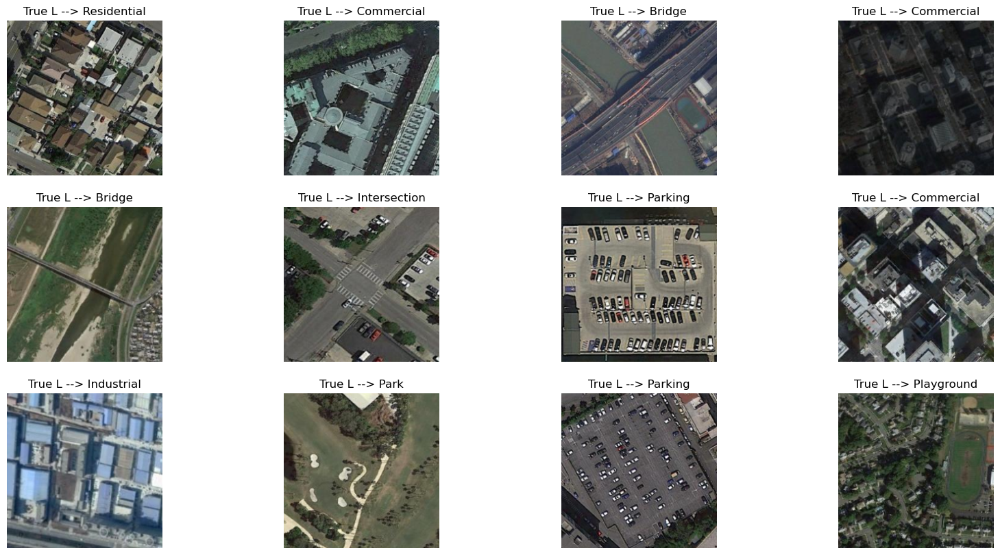

In [3]:
from src.visualization import tensor2image, plot_images
plot_images(tr_dl.dataset, 12, 3, "rgb", list(classes.keys()))

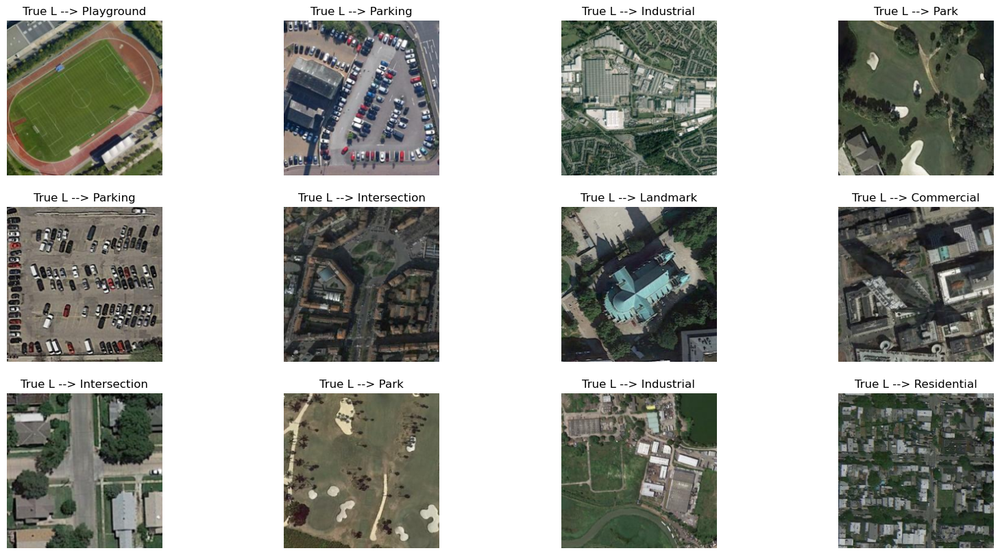

In [4]:
plot_images(tr_dl.dataset, 12, 3, "rgb", list(classes.keys()))

## Simple EDA: Class distributions

We will use a custom function that takes a dataset in our folder-structured way and plot the distribution per class

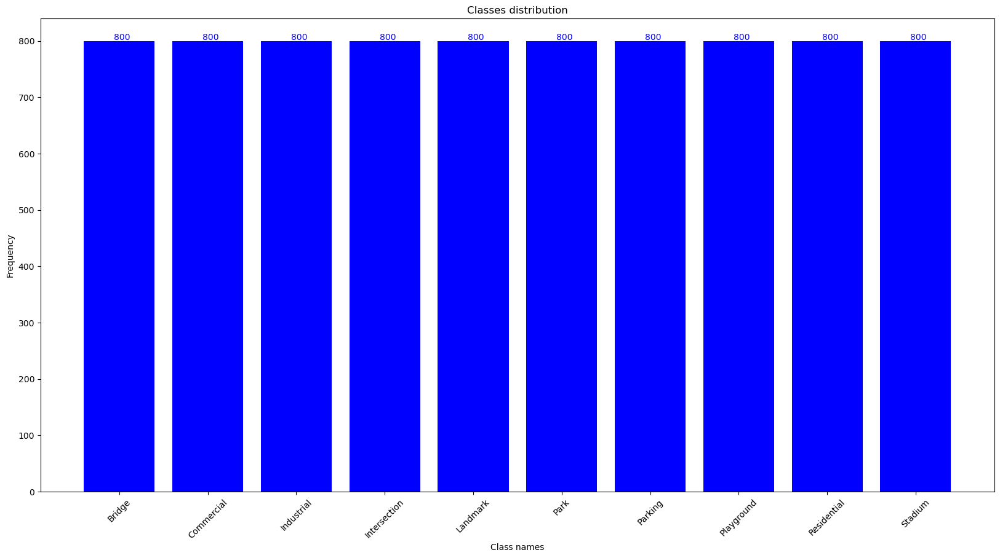

In [5]:
from src.visualization import class_distribution #Plot a distribution of our dataset
class_distribution(ds_path, transformations=transforms)

Classes are balanced across the dataset. This is good, however in order to mantain class proportions we created a stratified dataloaders function, which take into consideration the proportios per class and mantains the same proportions for the train, val and test dataloaders.

## Model import and training using PyTorch and evaluating using TensorBoard

Below we will perform the training of ConvNext_tiny model using simple functions to perform training cycle and test cycle for a number of epochs. The training will be logged using TensorBoard and its metrics can be seen in a local webapp by executing in a termianl the following command: `tensorboard --logdir=logs`.

Morever, we created a dictionary called `hyperparams` that stores the hyperparametres used on the training and also logs them in the experiment folder. In this way, we can compare between different experiments hyperparametres. We can enlarge this dictionary with more info if needed and tensorboard will log them.


### Defining imports, experiment params and utils function and define our training and eval cycle

In [7]:
import os
import timm
import torch
from torch.amp import GradScaler
from src.training import init_tensorboard_logs, setup_train, train_one_epoch, validate_one_epoch

#Change this number when doing an experiment forward 
experiment = 7
#Initialize a variable to track validation loss (used for saving best model)
best_val_loss = float("inf")
#Ditionary to track hyperparameters
hyperparams = {
    "lr": 1e-4,
    "bs": batch_size, #Defined above, when creatig the dataloaders
    "epochs": 10,
    "optimizer": "Adam", #This is only a text to log, to change it, go to "setup_train" and change it manually
    "precision FP16": True, #Store info about using mixed up precision FP16
    "stratification": True #This is a variable to save the state of our dataloaders (stratified or random)
}

#Initialize TensorBoard
writer = init_tensorboard_logs(experiment=experiment, hyperparams=hyperparams)
#Import pretrained model
model = timm.create_model("convnext_tiny", pretrained=True, num_classes=len(classes))
#Create the training setup for our transfer learning
model, epochs, device, loss_fn, optimizer = setup_train(model, hyperparams)
#Create the GradScaler object for FP16 mixup precision
scaler = GradScaler() #Scaler for FP16

for epoch in range(epochs):
    #Training step
    train_metrics = train_one_epoch(model, tr_dl, device, loss_fn, optimizer, scaler, writer, epoch)
    #Validation step
    val_metrics = validate_one_epoch(model, val_dl, device, loss_fn, writer, epoch)
    #Print metrics
    print(f"Epoch {epoch + 1}: {train_metrics} | {val_metrics}")

    #Save the best model
    if val_metrics["val_loss"] < best_val_loss:
        os.makedirs("saved_models", exist_ok=True)
        best_val_loss = val_metrics["val_loss"]
        torch.save(model.state_dict(), f"saved_models/best_model_{experiment}.pth")
        print(f"Current best weights in this epoch ({epoch+1}), saving it!")
#During our training, we are creating a summarywriter object for tensorboad. Once train is finished, close it.    
#Good practice is to clear memory
del optimizer
del loss_fn
torch.cuda.empty_cache()
writer.close()

100%|██████████| 13/13 [00:00<00:00, 15.66it/s]


Epoch 1: {'train_loss': 0.4778306744164891, 'train_accuracy': 0.8416666666666667} | {'val_loss': 0.4455044223712041, 'val_accuracy': 0.845, 'precision': 0.8791875, 'recall': 0.845}
Current best weights in this epoch (1), saving it!


100%|██████████| 13/13 [00:00<00:00, 15.64it/s]


Epoch 2: {'train_loss': 0.10109886129697164, 'train_accuracy': 0.9661111111111111} | {'val_loss': 0.4570645804588611, 'val_accuracy': 0.8675, 'precision': 0.8928125, 'recall': 0.8675}


100%|██████████| 13/13 [00:00<00:00, 13.84it/s]


Epoch 3: {'train_loss': 0.04145860673652755, 'train_accuracy': 0.9845833333333334} | {'val_loss': 0.1949397695179169, 'val_accuracy': 0.94, 'precision': 0.9420625000000001, 'recall': 0.94}
Current best weights in this epoch (3), saving it!


100%|██████████| 13/13 [00:00<00:00, 15.28it/s]


Epoch 4: {'train_loss': 0.07379350720180405, 'train_accuracy': 0.9755555555555555} | {'val_loss': 0.36129670704786593, 'val_accuracy': 0.8975, 'precision': 0.9290625, 'recall': 0.8975}


100%|██████████| 13/13 [00:01<00:00,  9.92it/s]


Epoch 5: {'train_loss': 0.04042471360829141, 'train_accuracy': 0.9865277777777778} | {'val_loss': 0.3374473429643191, 'val_accuracy': 0.9, 'precision': 0.9072499999999999, 'recall': 0.9}


100%|██████████| 13/13 [00:00<00:00, 15.71it/s]


Epoch 6: {'train_loss': 0.020345443073246212, 'train_accuracy': 0.9930555555555556} | {'val_loss': 0.22318308943739304, 'val_accuracy': 0.94, 'precision': 0.9433125, 'recall': 0.94}


100%|██████████| 13/13 [00:00<00:00, 15.02it/s]


Epoch 7: {'train_loss': 0.011321810914410485, 'train_accuracy': 0.9961111111111111} | {'val_loss': 0.23909149290277407, 'val_accuracy': 0.935, 'precision': 0.9369375000000001, 'recall': 0.935}


100%|██████████| 13/13 [00:00<00:00, 16.04it/s]


Epoch 8: {'train_loss': 0.04228954838381873, 'train_accuracy': 0.9869444444444444} | {'val_loss': 0.3078019885489574, 'val_accuracy': 0.9175, 'precision': 0.921875, 'recall': 0.9175}


100%|██████████| 13/13 [00:00<00:00, 14.82it/s]


Epoch 9: {'train_loss': 0.02623054555720753, 'train_accuracy': 0.9909722222222223} | {'val_loss': 0.326442026748107, 'val_accuracy': 0.9175, 'precision': 0.9254374999999999, 'recall': 0.9175}


100%|██████████| 13/13 [00:01<00:00, 10.03it/s]

Epoch 10: {'train_loss': 0.01676331624388695, 'train_accuracy': 0.9944444444444445} | {'val_loss': 0.42473842891362995, 'val_accuracy': 0.905, 'precision': 0.9115625, 'recall': 0.905}


We trained for 10 epochs using a RTX 2080 SUPER, and using a convnext_tiny it took me around 4min 30secs... Also it used only 3GB of my GPU memory... it means that if we want to go further we can scale up the model to a convnext_small or base.

Moreover, our best loss and accuracy was at EPOCH 3, and we saved those weights. Let's use them to do inferencing of our test set

### Checkpoint: Load model with best weights

Use this code below to load the best pretrained weights. Otherwise, if you want to continue using the last weights, skip it and use it directly (var name for the trained model is still `model`)

In [6]:
#Skip it if you want to use the last weights of your trined model above
#Load model
import timm
import torch

model = timm.create_model("convnext_tiny", pretrained=False, num_classes=len(classes))

#Load weights into the model
model.load_state_dict(torch.load("saved_models/best_model_7.pth"))
model.eval() #Put the model in eval mode

/tmp/ipykernel_156728/1001365966.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("saved_models/best_model_7.pth"))


ConvNeXt(
  (stem): Sequential(
    (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
    (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
  )
  (stages): Sequential(
    (0): ConvNeXtStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): ConvNeXtBlock(
          (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (norm): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=96, out_features=384, bias=True)
            (act): GELU()
            (drop1): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (fc2): Linear(in_features=384, out_features=96, bias=True)
            (drop2): Dropout(p=0.0, inplace=False)
          )
          (shortcut): Identity()
          (drop_path): Identity()
        )
        (1): ConvNeXtBlock(
          (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)


## Inferencing with our model: results

We created several functions to visualize our inferences in different way. Below we will use our functions to plot a confusion matrix and a image grid with its true labels and predictions.

In [7]:
from src.inference import run_inference, calculate_gradcam
from src.visualization import plot_confusion_matrix, plot_image_grid
#Make inferences using our fine-tuned model with the test dataset and using the CPU
#The returned valus are numpys and tensors moved to CPU (check the module)
images, labels, preds, accuracy = run_inference(model, "cuda", test_dl)

print(f"Accuracy of the model against our test dataset: {accuracy:.2f}% ")

Accuracy of the model against our test dataset: 92.00% 


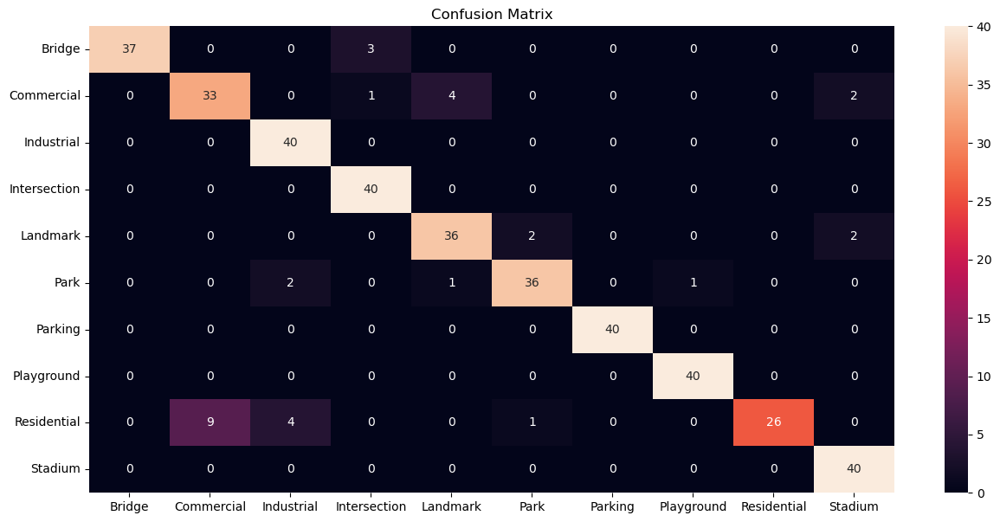

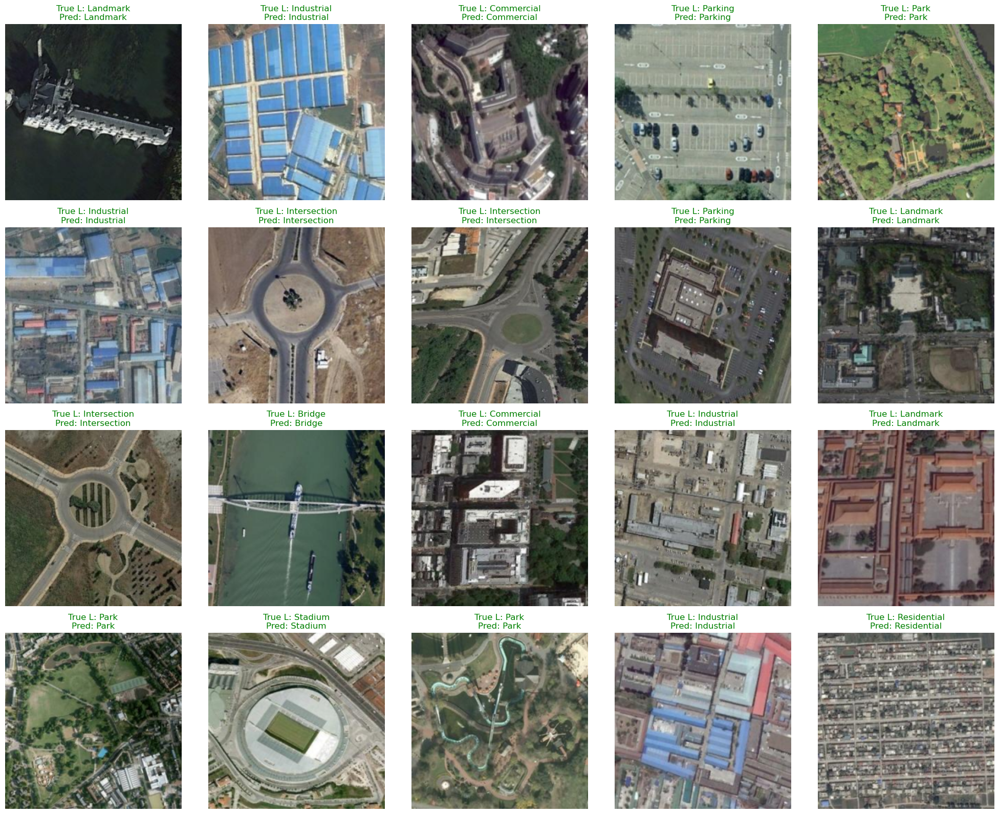

In [8]:
# Visualize predictions
plot_confusion_matrix(preds, labels, list(classes.keys()))
plot_image_grid(images, labels, preds, list(classes.keys()), num_images=20, rows=4)


## Integrating Captum and LayerGradCAM for extra information on our inference and visualization

### Configure Captum

For doing gradient class activation map, we have to define a target layer of our model to extract its activation map:

In [9]:
#Selec the target layer for the GradCAM (these are 2 ways, i am experimenting with them)
target_layer = model.stages[-1].blocks[-1]#.conv_dw
another_way_to_target_layer = list(model.children())[-3]

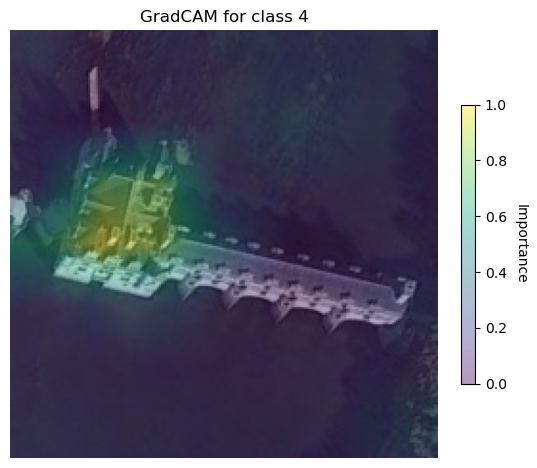

In [10]:
from src.visualization import visualize_gradcam

device = "cuda" #We defined it here again in case the training cell was not run. Device is defined there
#Function visualize_gradcam expect an image with dummy batch in the same device as the model,
#and label as native int (not a numpy int)
image, label = images[0].unsqueeze(0).to(device), int(labels[0])
heatmap = calculate_gradcam(model, target_layer, image, label)
visualize_gradcam(image, heatmap, label)

Now that we have a function to show GradCAM, we can create a GradCAM for each class using a true image, to see if what the model is "seeing" is revelant to our needs. For that we will use a sample of 1 image per class located in the folder `test_images_GradCAM´. Feel free to change them.

Class: Parking


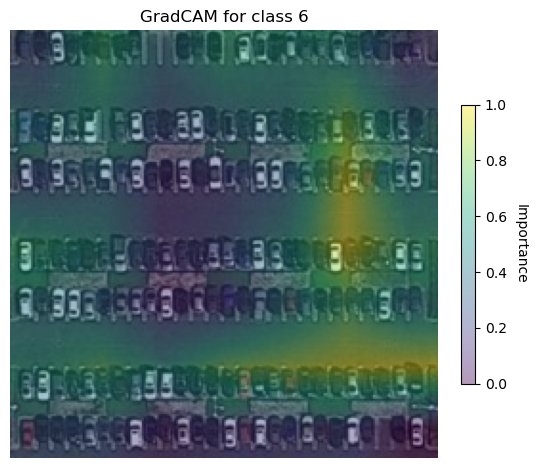

Class: Intersection


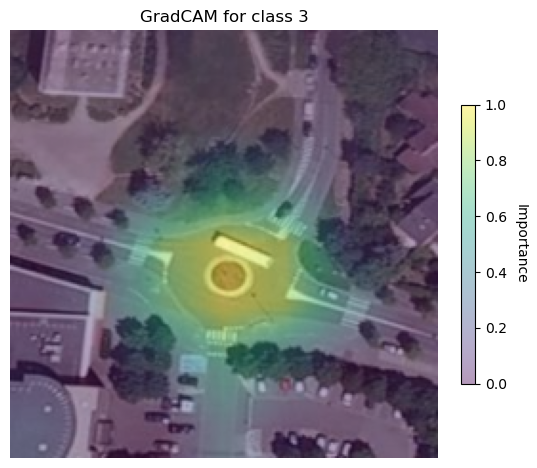

Class: Commercial


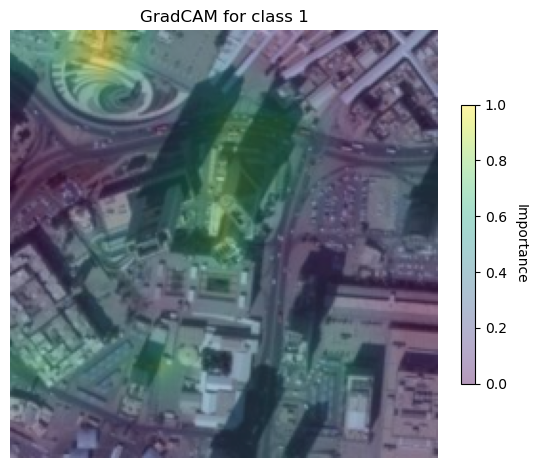

Class: Residential


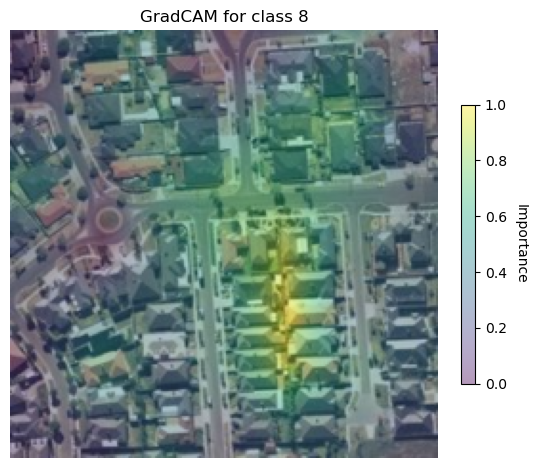

Class: Industrial


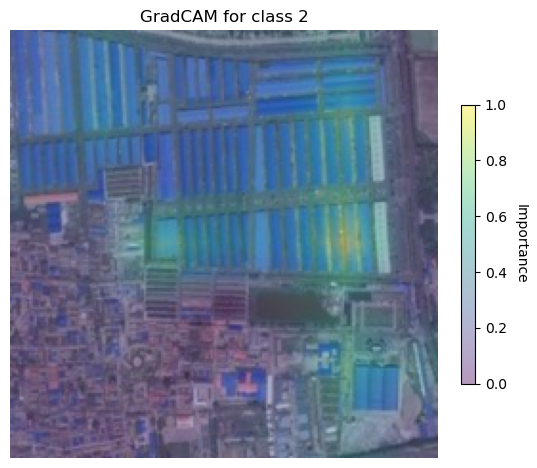

Class: Bridge


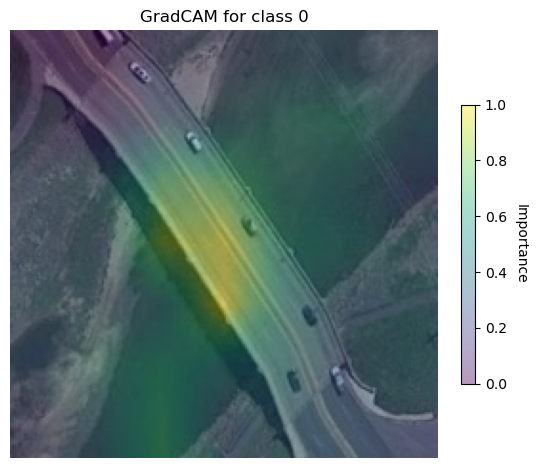

Class: Playground


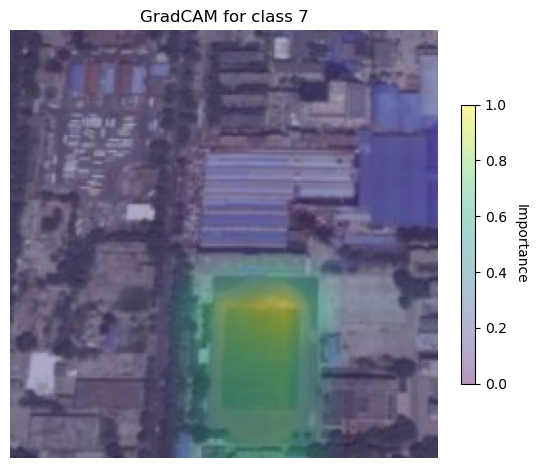

Class: Landmark


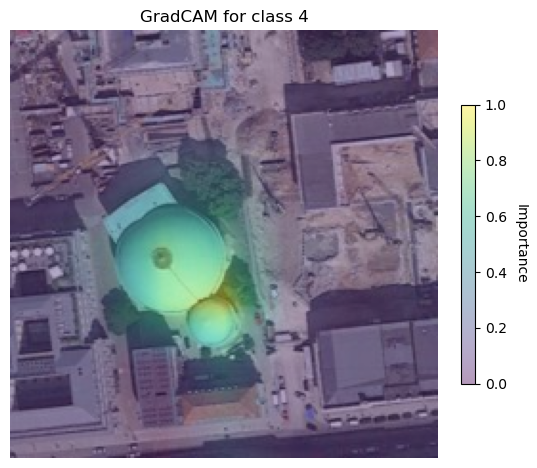

Class: Park


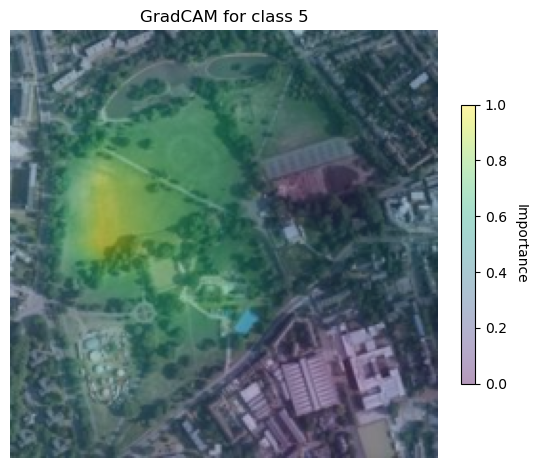

Class: Stadium


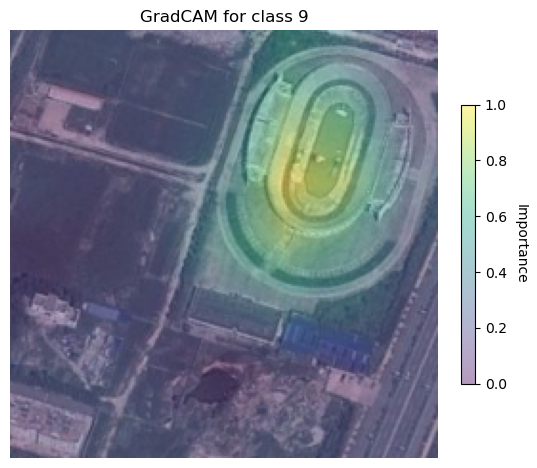

In [11]:
from PIL import Image
import os

test_images_folder = "test_images_GradCAM"
# Creates a dict with name of image as key and class as value, using the "classes" var from our dataloaders output
images_files = {f: classes[f.split(".")[0].capitalize()] for f in os.listdir(test_images_folder) if f.endswith(".jpg")}

for img, cls in images_files.items():
    #Get the image as PIL and label
    image = Image.open(os.path.join(test_images_folder,img)).convert("RGB")
    #We use
    lbl_id = classes[img.split(".")[0].capitalize()]
    
    #Transform and add dummy batch to image
    trf_image = transforms(image).unsqueeze(0).to(device)
    #Create gradcam heatmap
    heatmap = calculate_gradcam(model, target_layer, trf_image, lbl_id)
    #Print the class as name
    print("Class: " + img.split(".")[0].capitalize())
    #Invoke the function to show the GradCAM
    visualize_gradcam(trf_image, heatmap,  lbl_id)


Awesome! Our model is working quite good, as we can see:
- For parking, is focusing where the vehicles are
- For intersection, looks exactly at the intersection

...

- For playgroud, is focusing on the field of the playground

and so...

Therefor the model is working well, and the interpretation that is doing from our input images seems correct.

## Feature attribution using Captum IntegratedGradients

Imagine you have a model that takes an image as input and gives you a prediction—a confidence score for each possible category. Feature attribution is about figuring out which parts of the image (which pixels or regions) were most important for that particular prediction. Let's do a simple feature attribution using `IntegratedGradients`

In [12]:
from captum.attr import IntegratedGradients
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

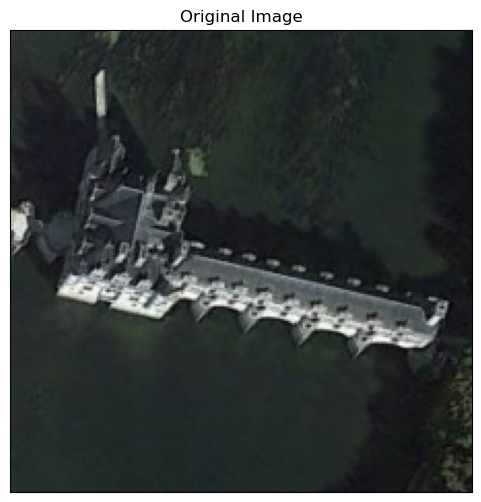

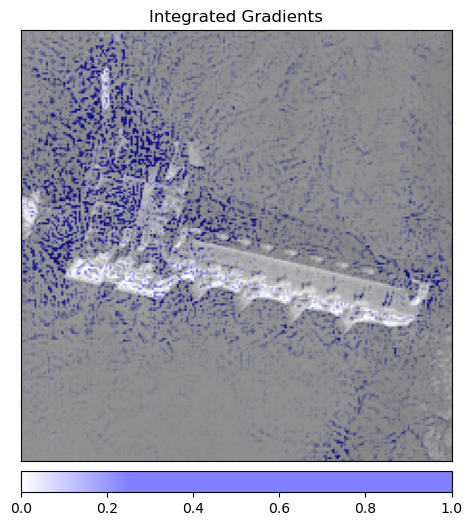

In [13]:
#Initialization of the attribute algorithm
#Integrated Gradients consume quite a big chunk of memory. GPU is faster but may overflow. Use cpu instead if that happens
device_for_IG = "cpu"
integrated_gradients = IntegratedGradients(model.to(device_for_IG))

#Get the attributions of our output
attributions_image = integrated_gradients.attribute(images[0].unsqueeze(0).to(device_for_IG), target=int(labels[0]), n_steps=100)

#Show the original image for comparison
viz.visualize_image_attr(None, 
                        tensor2image(images[0]),
                        method="original_image", title="Original Image"
                        )

default_cmap = LinearSegmentedColormap.from_list("custom blue",
                                                 [(0, "#ffffff"),
                                                  (0.25, "#0000ff"),
                                                  (1, "#0000ff")], N=256)

#Show the overlaping map with the original image
viz.visualize_image_attr(np.transpose(attributions_image.squeeze().cpu().detach().numpy(), (1,2,0)),
                        tensor2image(images[0]),
                        method="blended_heat_map",
                        cmap=default_cmap,
                        show_colorbar=True,
                        sign="positive",
                        title="Integrated Gradients")
#Integrated gradients consume quite a chunk of memory if done in GPU. That's why we clean the cache
del attributions_image
torch.cuda.empty_cache()

We are using Integrated Gradients (IG), a technique to help understand which parts of an input image are most important for a model's prediction. 
Integrated Gradients creates a map that shows which parts of an image were most important for the model's prediction, by gradually comparing the original image to a baseline (like a blank image) in small steps. The result is a heatmap that highlights areas the model focused on, and when blended with the original image, it visually explains what influenced the model's decision.


## The end!


